In [2]:
import pandas as pd
from datetime import datetime, timedelta
import matplotlib.pyplot as plt
import seaborn as sb
from sklearn.preprocessing import StandardScaler

In [3]:
sequences_df = pd.read_excel('sequences.xlsx')
sequences_df['DateTime'] = pd.to_datetime(sequences_df['DateTime'])
print(sequences_df['event_description'].nunique())
print(sequences_df['event_description'].unique())

14
['SessionLaunched' 'KnowledgeComponentStarted'
 'InstructionalItemsSelected' 'SessionTerminated' 'SessionPaused'
 'SessionContinued' 'AssessmentItemSelected' 'emotion_detection'
 'AssessmentItemAnswered' 'SessionAbandoned' 'KnowledgeComponentPassed'
 'KnowledgeComponentSatisfied' 'KnowledgeComponentCompleted'
 'HintsRequested']


In [155]:
sequences_df.describe()

,Unnamed: 0,hint_order,correct_answer,correctness_percentage,reattempt_count,knowledge_component_code,LearnerId
count,46800.000000,46800.000000,46800.000000,46800.000000,46800.000000,46800.000000,46800.000000
mean,231114.384038,-0.942692,-0.592970,-0.540392,-0.572009,437.550983,-329.761603
std,40903.366651,0.235356,0.680685,0.770180,0.752203,91.980026,2205.973134
min,0.000000,-1.000000,-1.000000,-1.000000,-1.000000,-299.000000,-9991.000000
25%,217154.750000,-1.000000,-1.000000,-1.000000,-1.000000,468.000000,91.000000
50%,231092.000000,-1.000000,-1.000000,-1.000000,-1.000000,471.000000,151.000000
75%,251026.250000,-1.000000,0.000000,0.000000,0.000000,479.000000,236.000000
max,289581.000000,1.000000,1.000000,1.000000,2.000000,546.000000,426.000000


In [156]:
sequences_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 46800 entries, 0 to 46799
Data columns (total 12 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Unnamed: 0                46800 non-null  int64  
 1   DateTime                  46800 non-null  object 
 2   event_description         46800 non-null  object 
 3   hint_order                46800 non-null  int64  
 4   correct_answer            46800 non-null  int64  
 5   correctness_percentage    46800 non-null  float64
 6   reattempt_count           46800 non-null  int64  
 7   submission_type           46800 non-null  object 
 8   knowledge_component_code  46800 non-null  int64  
 9   LearnerId                 46800 non-null  int64  
 10  Emotion                   46800 non-null  object 
 11  TimeOfDay                 46800 non-null  object 
dtypes: float64(1), int64(6), object(5)
memory usage: 4.3+ MB


In [157]:
columns_to_scale = ['knowledge_component_code', 'LearnerId']
scaler = StandardScaler()
sequences_df[columns_to_scale] = scaler.fit_transform(sequences_df[columns_to_scale])

## Number of events from SessionLaunched/SessionContinued to emotion_detection

In [37]:
sequence_lengths = []
number_of_events = 0
sequence_length_emotion = pd.DataFrame(columns=['SequenceLenght', 'Emotion', 'LearnerId'])

for id, sequence in sequences_df.iterrows():
    if sequence['event_description'] == 'SessionLaunched' or sequence['event_description'] == 'SessionContinued':
        number_of_events = 1
    elif sequence['event_description'] == 'emotion_detection':
        sequence_lengths.append(number_of_events)
        sequence_length_emotion.loc[len(sequence_length_emotion)] = ([number_of_events, sequence['Emotion'], sequence['LearnerId']])
    else:
        number_of_events = number_of_events + 1

## Number of events from SessionLaunched/SessionContinued to emotion_detection with 20 minutes constraint

In [159]:
sequences_df['DateTime'] = pd.to_datetime(sequences_df['DateTime'])
sequence_length_emotion = pd.DataFrame(columns=['SequenceLenght', 'Emotion', 'LearnerId'])

sequence_lengths = []
number_of_events = 0
time_of_end = pd.to_datetime(datetime.now())
num_rows = len(sequences_df)
event_description = False

for i in reversed(range(num_rows)):
    sequence = sequences_df.iloc[i]
    if sequence['event_description'] == 'emotion_detection':
        number_of_events = 0
        time_of_end = sequence['DateTime']
        event_description = True
        emotion = sequence['Emotion']
    elif (sequence['event_description'] == 'SessionLaunched' or sequence['event_description'] == 'SessionContinued' or (time_of_end - sequence['DateTime'] >= timedelta(minutes=20))) and event_description:
        number_of_events = number_of_events + 1
        sequence_lengths.append(number_of_events)
        sequence_length_emotion.loc[len(sequence_length_emotion)] = ([number_of_events, emotion, sequence['LearnerId']])
        event_description = False
    else:
        number_of_events = number_of_events + 1

## Number of events from SessionLaunched/SessionContinued to SessionTerminated/SessionPaused/SessionAbandoned

In [38]:
sequence_lengths = []
number_of_events = 0
sequence_length_emotion = pd.DataFrame(columns=['SequenceLenght', 'LearnerId'])
session_started = False
learner_id = 0

for id, sequence in sequences_df.iterrows():
    if sequence['event_description'] == 'SessionLaunched' or sequence['event_description'] == 'SessionContinued':
        number_of_events = 1
        session_started = True
        learner_id = sequence['LearnerId']
    elif (sequence['event_description'] == 'SessionTerminated' or sequence['event_description'] == 'SessionPaused' or sequence['event_description'] == 'SessionAbandoned') and session_started and sequence['LearnerId'] == learner_id:
        sequence_lengths.append(number_of_events)
        sequence_length_emotion.loc[len(sequence_length_emotion)] = ([number_of_events, sequence['LearnerId']])
        session_started = False
    else:
        number_of_events = number_of_events + 1

## Minutes passed from SessionLaunched/SessionContinued to emotion_detected

In [189]:
sequence_lengths = []
time_of_event = 0
time_delta = 0
sequence_length_emotion = pd.DataFrame(columns=['SequenceLenght', 'Emotion', 'LearnerId'])

for id, sequence in sequences_df.iterrows():
    if sequence['event_description'] == 'SessionLaunched' or sequence['event_description'] == 'SessionContinued':
        time_of_event = sequence['DateTime']
        session_started = True
        learner_id = sequence['LearnerId']
    elif sequence['event_description'] == 'emotion_detection' and session_started and sequence['LearnerId'] == learner_id:
        time_delta = (sequence['DateTime'] - time_of_event).total_seconds()/60
        sequence_lengths.append(time_delta)
        sequence_length_emotion.loc[len(sequence_length_emotion)] = ([time_delta, sequence['Emotion'], sequence['LearnerId']])
        session_started = False
    else:
        continue

## Minutes passed from SessionLaunched/SessionContinued to SessionTerminated/SessionPaused/SessionAbandoned

In [207]:
sequence_lengths = []
time_of_event = 0
time_delta = 0
sequences_df = sequences_df.sort_values(by=['LearnerId', 'DateTime'])
sequence_length_emotion = pd.DataFrame(columns=['SequenceLenght', 'LearnerId'])
session_started = False
learner_id = 0

for id, sequence in sequences_df.iterrows():
    if sequence['event_description'] == 'SessionLaunched' or sequence['event_description'] == 'SessionContinued':
        time_of_event = sequence['DateTime']
        session_started = True
        learner_id = sequence['LearnerId']
    elif (sequence['event_description'] == 'SessionTerminated' or sequence['event_description'] == 'SessionPaused' or sequence['event_description'] == 'SessionAbandoned') and session_started and sequence['LearnerId'] == learner_id:
        time_delta = (sequence['DateTime'] - time_of_event).total_seconds()/60
        sequence_lengths.append(time_delta)
        sequence_length_emotion.loc[len(sequence_length_emotion)] = ([time_delta, sequence['LearnerId']])
        session_started = False
    else:
        continue

## Minutes passed between every event from SessionLaunched/SessionContinued to SessionTerminated/SessionPaused/SessionAbandoned

In [1]:
sequence_lengths = []
time_of_event = 0
time_delta = 0
sequences_df = sequences_df.sort_values(by=['LearnerId', 'DateTime'])
sequence_length_emotion = pd.DataFrame(columns=['SequenceLenght', 'LearnerId'])
session_started = False
learner_id = 0

for id, sequence in sequences_df.iterrows():
    if sequence['event_description'] == 'SessionLaunched' or sequence['event_description'] == 'SessionContinued':
        time_of_event = sequence['DateTime']
        session_started = True
        learner_id = sequence['LearnerId']
    elif (sequence['event_description'] == 'SessionTerminated' or sequence['event_description'] == 'SessionPaused' or sequence['event_description'] == 'SessionAbandoned') and session_started and sequence['LearnerId'] == learner_id:
        time_delta = (sequence['DateTime'] - time_of_event).total_seconds()/60
        sequence_lengths.append(time_delta)
        sequence_length_emotion.loc[len(sequence_length_emotion)] = ([time_delta, sequence['LearnerId']])
        session_started = False
    elif session_started and sequence['LearnerId'] == learner_id:
        time_delta = (sequence['DateTime'] - time_of_event).total_seconds()/60
        sequence_lengths.append(time_delta)
        sequence_length_emotion.loc[len(sequence_length_emotion)] = ([time_delta, sequence['LearnerId']])
        time_of_event = sequence['DateTime']

NameError: name 'sequences_df' is not defined

## Minutes in session from SessionLaunched/SessionContinued until 15 minutes inactivity

In [29]:
sequence_lengths = []
time_of_event = 0
time_delta = 0
sequences_df = sequences_df.sort_values(by=['LearnerId', 'DateTime'])
sequence_length_emotion = pd.DataFrame(columns=['SequenceLenght', 'LearnerId', 'Emotion'])
session_started = False
learner_id = 0
sequence_df_length = len(sequences_df)
emotion = ''

for i in range(sequence_df_length):
    sequence = sequences_df.iloc[i]
    if i < len(sequences_df)-1:
        next_sequence = sequences_df.iloc[i+1]
        if sequence['event_description'] == 'SessionLaunched' or sequence['event_description'] == 'SessionContinued':
            time_of_event = sequence['DateTime']
            session_started = True
            learner_id = sequence['LearnerId']
            emotion = ''
        elif ((next_sequence['DateTime'] - sequence['DateTime']) < timedelta(minutes=20)) and session_started and sequence['LearnerId'] == learner_id:
            time_delta = (sequence['DateTime'] - time_of_event).total_seconds()/60
            sequence_lengths.append(time_delta)
            sequence_length_emotion.loc[len(sequence_length_emotion)] = ([time_delta, sequence['LearnerId'], emotion])
            session_started = False
        elif session_started and sequence['LearnerId'] == learner_id and sequence['event_description'] == 'emotion_detection':
            print("usao")
            emotion = sequence['Emotion']

## Min, Max, Mean and Std

In [19]:
import numpy as np

# Calculate statistics
min_length = np.min(sequence_lengths)
max_length = np.max(sequence_lengths)
mean_length = np.mean(sequence_lengths)
std_length = np.std(sequence_lengths)

# Print the results
print(f"Minimum Length: {min_length}")
print(f"Maximum Length: {max_length}")
print(f"Mean Length: {mean_length}")
print(f"Standard Deviation: {std_length}")

Minimum Length: 5.0000000000000004e-08
Maximum Length: 19993.9562509
Mean Length: 11.387398366334207
Standard Deviation: 324.7862131231574


In [25]:
filtered_rows = sequence_length_emotion[sequence_length_emotion['SequenceLenght'] < 200]

result = filtered_rows.groupby('LearnerId')['SequenceLenght'].agg(['min', 'max', 'mean', 'std']).reset_index()

# Display the result
print(result)

     LearnerId           min           max          mean        std
0        -9991  1.666667e-07  2.383089e+01  2.292369e+00   6.616738
1        -9987  1.666667e-07  2.076691e+01  3.341534e+00   6.797359
2        -9985  2.833333e-07  2.833333e-07  2.833333e-07        NaN
3        -9982  2.166667e-07  1.268980e+01  2.088328e+00   4.452877
4        -9969  1.500000e-07  4.306004e+01  3.171911e+00   8.744176
..         ...           ...           ...           ...        ...
220        395  3.564017e-03  3.564017e-03  3.564017e-03        NaN
221        408  4.500000e-07  5.184860e-02  1.605508e-02   0.021935
222        409  3.166667e-07  1.121477e+02  2.243313e+01  50.151976
223        421  2.000000e-07  6.875752e+01  3.977416e+00  14.235550
224        426  2.944250e-03  2.944250e-03  2.944250e-03        NaN

[225 rows x 5 columns]


# Charts

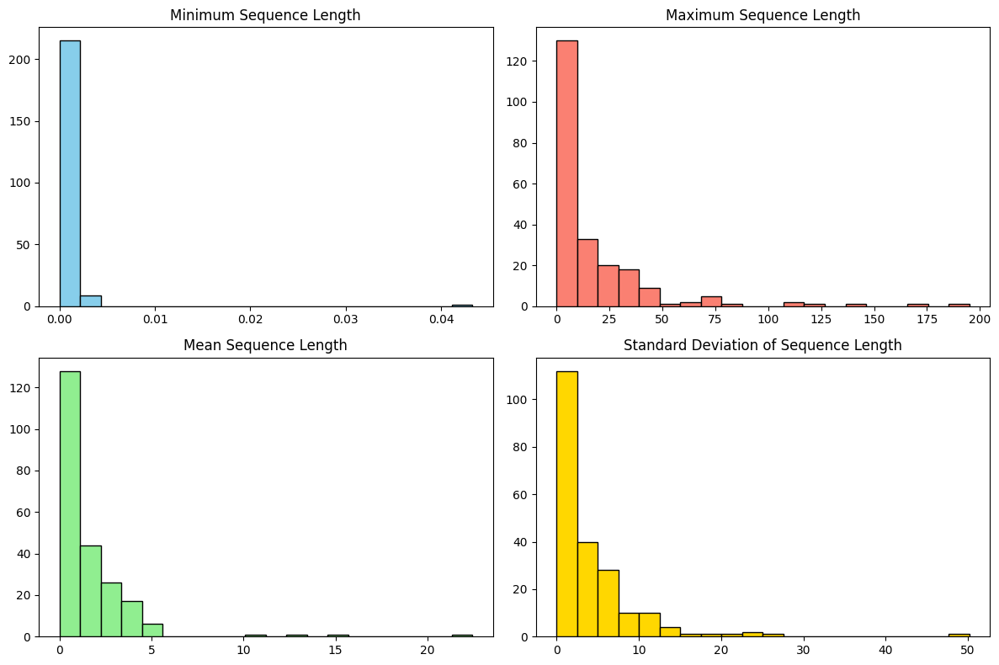

In [26]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12, 8))

# Histogram for minimum sequence length
axes[0, 0].hist(result['min'], bins=20, color='skyblue', edgecolor='black')
axes[0, 0].set_title('Minimum Sequence Length')

# Histogram for maximum sequence length
axes[0, 1].hist(result['max'], bins=20, color='salmon', edgecolor='black')
axes[0, 1].set_title('Maximum Sequence Length')

# Histogram for mean sequence length
axes[1, 0].hist(result['mean'], bins=20, color='lightgreen', edgecolor='black')
axes[1, 0].set_title('Mean Sequence Length')

# Histogram for standard deviation of sequence length
axes[1, 1].hist(result['std'], bins=20, color='gold', edgecolor='black')
axes[1, 1].set_title('Standard Deviation of Sequence Length')

plt.tight_layout()
plt.show()

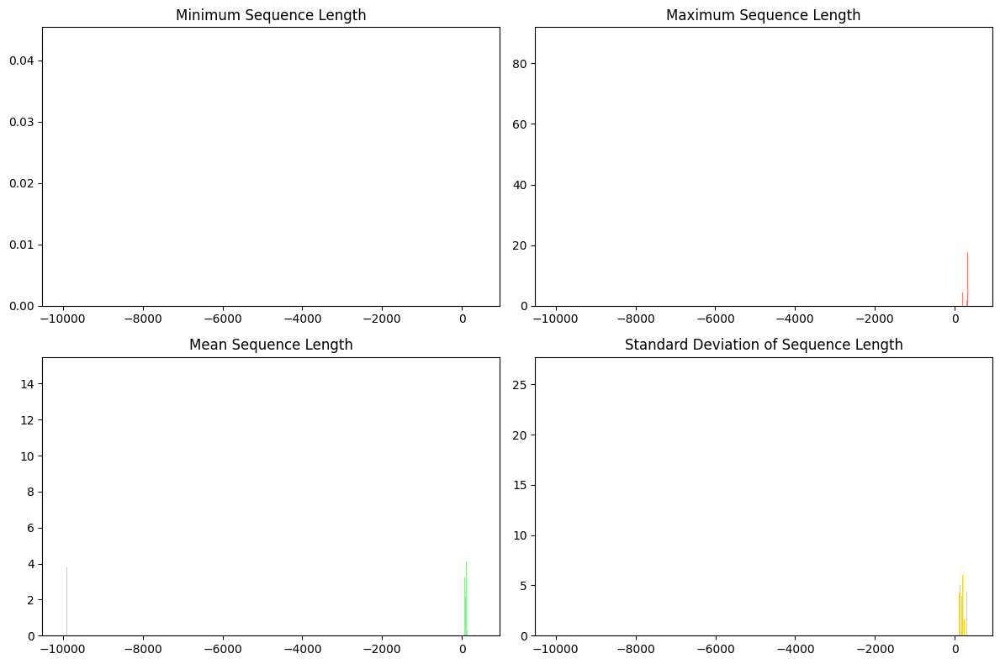

In [9]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12, 8))

# Bar plot for minimum sequence length
axes[0, 0].bar(result['LearnerId'], result['min'], color='skyblue')
axes[0, 0].set_title('Minimum Sequence Length')

# Bar plot for maximum sequence length
axes[0, 1].bar(result['LearnerId'], result['max'], color='salmon')
axes[0, 1].set_title('Maximum Sequence Length')

# Bar plot for mean sequence length
axes[1, 0].bar(result['LearnerId'], result['mean'], color='lightgreen')
axes[1, 0].set_title('Mean Sequence Length')

# Bar plot for standard deviation of sequence length
axes[1, 1].bar(result['LearnerId'], result['std'], color='gold')
axes[1, 1].set_title('Standard Deviation of Sequence Length')

plt.tight_layout()
plt.show()

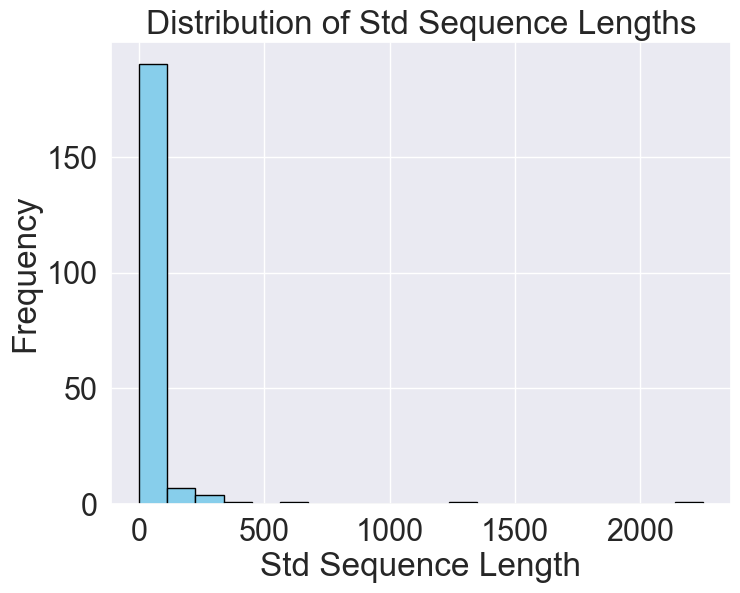

In [199]:
mean_sequence_length = sequence_length_emotion.groupby('LearnerId')['SequenceLenght'].std()

# Plot histogram for mean sequence length
plt.figure(figsize=(8, 6))
plt.hist(mean_sequence_length, bins=20, color='skyblue', edgecolor='black')
plt.title('Distribution of Std Sequence Lengths')
plt.xlabel('Std Sequence Length')
plt.ylabel('Frequency')
plt.show()

In [27]:
sequence_length_emotion['SequenceLenght'] = sequence_length_emotion['SequenceLenght'].astype(str)
sequence_length_emotion['Emotion'].unique()

array([''], dtype=object)

In [28]:
sequence_length_emotion.head()

,SequenceLenght,LearnerId,Emotion
0,1.6666666666666668e-07,-9991,
1,2.3333333333333333e-07,-9991,
2,16.431790833333334,-9991,
3,0.0028496166666666664,-9991,
4,2.1666666666666665e-07,-9991,


In [10]:
sequence_length_emotion.head()
sequence_length_emotion['PreviousEmotion'] = sequence_length_emotion.groupby('LearnerId')['Emotion'].shift(1)

# Drop the first row in each group since it will have NaN for PreviousEmotion
sequence_length_emotion = sequence_length_emotion.dropna(subset=['PreviousEmotion'])

# Now you can analyze the relationship between 'PreviousEmotion' and 'Emotion'
correlation_matrix = sequence_length_emotion.groupby('LearnerId')[['PreviousEmotion', 'Emotion']].corr().iloc[0::2, -1]

# Display or visualize the correlation matrix
plt.figure(figsize=(10, 6))
sb.histplot(data=sequence_length_emotion, x='PreviousEmotion', y='Emotion', bins=20, cmap='viridis')
plt.xlabel('Previous Emotion')
plt.ylabel('Current Emotion')
plt.title('Distribution of Previous and Current Emotion')
plt.show()

KeyError: 'Column not found: Emotion'

In [165]:
temp_dict = {
    'Angažovanost' : 1,
    'Neutralno' : 1,
    'Frustracija' : 3,
    'Zbunjenost' : 4,
    'Nezainteresovanost' : 5,
    'Umor' : 6,
    
}

sequence_length_emotion['Emotion'] = sequence_length_emotion['Emotion'].map(temp_dict)

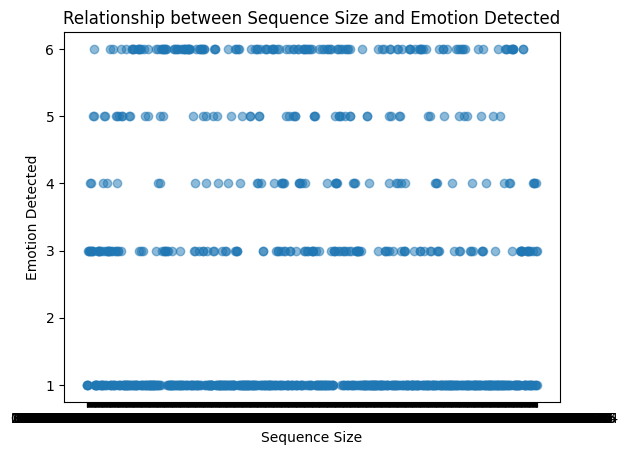

In [68]:
# Drop rows with NaN values in 'SequenceLenght'
sequence_length_emotion = sequence_length_emotion.dropna(subset=['SequenceLenght'])

# Create a bar plot
plt.scatter(sequence_length_emotion['SequenceLenght'], sequence_length_emotion['Emotion'], alpha=0.5)

# Add labels and title
plt.xlabel('Sequence Size')
plt.ylabel('Emotion Detected')
plt.title('Relationship between Sequence Size and Emotion Detected')

# Show the plot
plt.show()

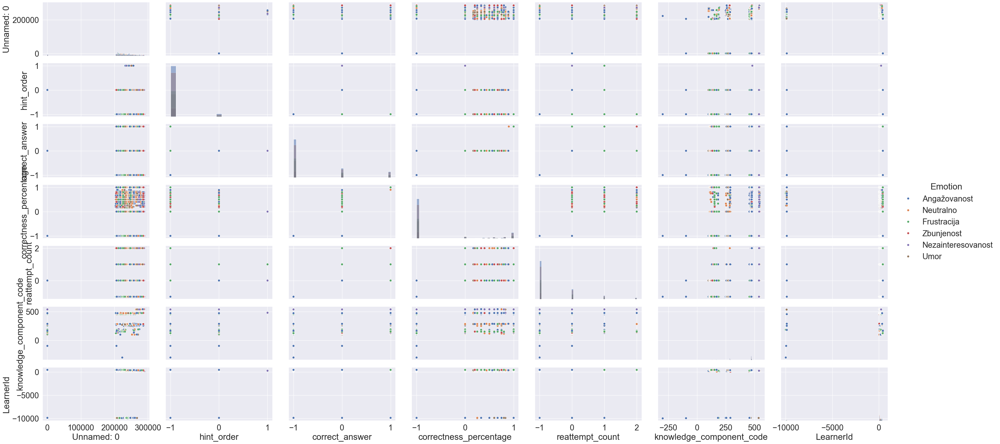

In [184]:
sb.set(font_scale=2)
sb.pairplot(sequences_df,hue="Emotion", diag_kind="hist", aspect=2)
plt.savefig('pairplot.png')

In [176]:
temp_dict_emotion = {
    'Angažovanost' : 1,
    'Neutralno' : 1,
    'Frustracija' : 3,
    'Zbunjenost' : 4,
    'Nezainteresovanost' : 5,
    'Umor' : 6,
}

temp_dict_submission_type = {
    'MrqSubmission' : 1,
    'McqSubmission' : 2,
    'SaqSubmission' : 3    
}

temp_dict_daytime = {
    'morning' : 1,
    'noon' : 2,
    'evening' : 3,
    'night' : 4
}
sequences_df_copy = sequences_df.copy()
sequences_df_copy['Emotion'] = sequences_df_copy['Emotion'].map(temp_dict_emotion)
sequences_df_copy['submission_type'] = sequences_df_copy['submission_type'].map(temp_dict_submission_type)
sequences_df_copy['TimeOfDay'] = sequences_df_copy['TimeOfDay'].map(temp_dict_daytime)

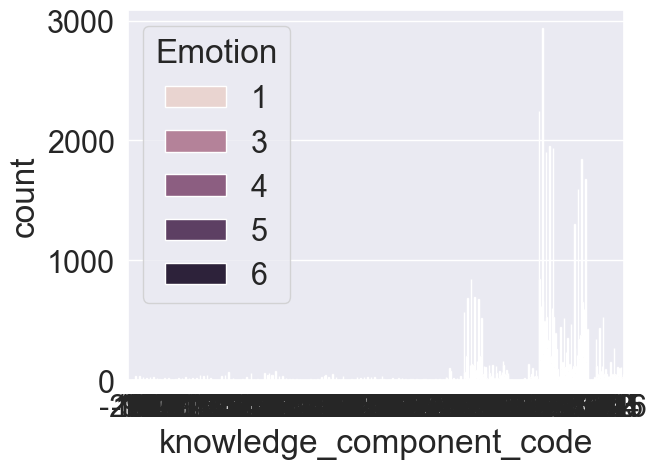

In [173]:
filtered_df = sequences_df_copy.dropna(subset=['Emotion'])

# Plot only the filtered rows
sb.countplot(x='knowledge_component_code', hue='Emotion', data=sequences_df_copy)
plt.show()

In [185]:
knowledge_component_codes = filtered_df['knowledge_component_code'].unique()

# Create subplots
fig, axes = plt.subplots(nrows=len(knowledge_component_codes), ncols=1, figsize=(10, 4 * len(knowledge_component_codes)))

# If there's only one knowledge component code, axes will not be a list, so we need to handle it
if not isinstance(axes, np.ndarray):
    axes = np.array([axes])

# Iterate through each knowledge component code
for i, code in enumerate(knowledge_component_codes):
    sb.countplot(x='Emotion', data=filtered_df[filtered_df['knowledge_component_code'] == code], ax=axes[i])
    
    # Add labels and title
    axes[i].set_xlabel('Emotion Detected')
    axes[i].set_ylabel('Count')
    axes[i].set_title(f'Number of Emotions Detected for Knowledge Component Code {code}')

plt.savefig('KCC.png')
# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

In [145]:
sequences_df_copy['DateTime'] = pd.to_datetime(sequences_df_copy['DateTime'])

events_encoded = pd.get_dummies(sequences_df_copy['event_description'], prefix='event')
merged_df = pd.concat([sequences_df_copy, events_encoded], axis=1)

In [146]:
merged_df.head()

,Unnamed: 0,DateTime,event_description,hint_order,correct_answer,correctness_percentage,reattempt_count,submission_type,knowledge_component_code,LearnerId,...,event_KnowledgeComponentCompleted,event_KnowledgeComponentPassed,event_KnowledgeComponentSatisfied,event_KnowledgeComponentStarted,event_SessionAbandoned,event_SessionContinued,event_SessionLaunched,event_SessionPaused,event_SessionTerminated,event_emotion_detection
0,223366,2023-05-03 08:21:34.053373100+00:00,SessionLaunched,-1,-1,-1.0,-1,NaN,-299,-9991,...,False,False,False,False,False,False,True,False,False,False
1,223367,2023-05-03 08:21:34.053384+00:00,KnowledgeComponentStarted,-1,-1,-1.0,-1,NaN,-299,-9991,...,False,False,False,True,False,False,False,False,False,False
2,223368,2023-05-03 08:21:34.227705200+00:00,InstructionalItemsSelected,-1,-1,-1.0,-1,NaN,-299,-9991,...,False,False,False,False,False,False,False,False,False,False
3,223369,2023-05-03 08:21:41.060951500+00:00,SessionTerminated,-1,-1,-1.0,-1,NaN,-299,-9991,...,False,False,False,False,False,False,False,False,True,False
4,223371,2023-05-03 08:23:55.677682100+00:00,SessionLaunched,-1,-1,-1.0,-1,NaN,291,-9991,...,False,False,False,False,False,False,True,False,False,False


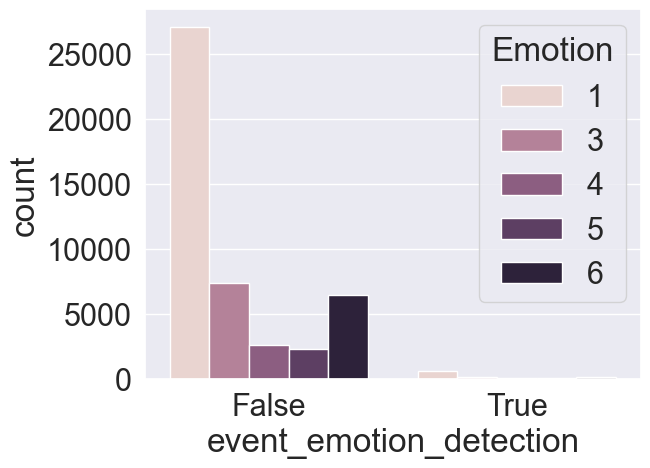

In [147]:
sb.countplot(x='event_emotion_detection', hue='Emotion', data=merged_df)
plt.show()

In [216]:
seuquence_emotion_df = pd.DataFrame(columns = ['Event','Emotion'])
num_rows = len(sequences_df)
emotion = ''
for i in reversed(range(num_rows)):
    sequence = sequences_df.iloc[i]
    if sequence['event_description'] == 'emotion_detection':
        emotion = sequence['Emotion']
        seuquence_emotion_df.loc[len(seuquence_emotion_df)] = [sequence['event_description'], emotion]
        event_description = True
    elif (sequence['event_description'] == 'SessionLaunched' or sequence['event_description'] == 'SessionContinued') and event_description:
        seuquence_emotion_df.loc[len(seuquence_emotion_df)] = [sequence['event_description'], emotion]
        event_description = False
    elif (sequence['event_description'] != 'SessionLaunched' and sequence['event_description'] != 'SessionContinued') and event_description:
        seuquence_emotion_df.loc[len(seuquence_emotion_df)] = [sequence['event_description'], emotion]

In [108]:
seuquence_emotion_df['Event'].unique()

array(['emotion_detection', 'InstructionalItemsSelected',
       'SessionLaunched', 'KnowledgeComponentStarted',
       'AssessmentItemSelected', 'AssessmentItemAnswered',
       'SessionContinued', 'SessionPaused', 'KnowledgeComponentSatisfied',
       'KnowledgeComponentPassed', 'SessionAbandoned', 'HintsRequested',
       'KnowledgeComponentCompleted'], dtype=object)

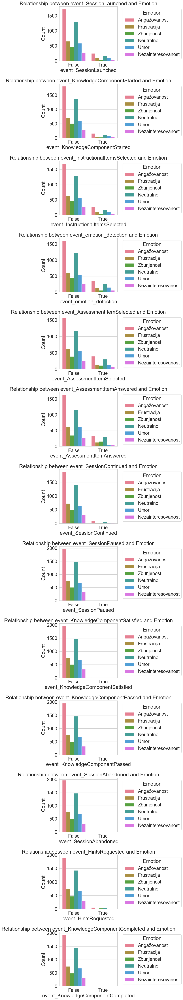

In [229]:
events_encoded = pd.get_dummies(seuquence_emotion_df['Event'], prefix='event')
merged_df = pd.concat([seuquence_emotion_df, events_encoded], axis=1)

events = ['event_SessionLaunched', 'event_KnowledgeComponentStarted', 'event_InstructionalItemsSelected', 
          'event_emotion_detection','event_AssessmentItemSelected', 'event_AssessmentItemAnswered',
       'event_SessionContinued', 'event_SessionPaused', 'event_KnowledgeComponentSatisfied',
       'event_KnowledgeComponentPassed', 'event_SessionAbandoned', 'event_HintsRequested',
       'event_KnowledgeComponentCompleted']  # Add all events

fig, axes = plt.subplots(nrows=len(events), ncols=1, figsize=(10, 5 * len(events)))

for i, event in enumerate(events):
    sb.countplot(x=event, hue='Emotion', data=merged_df, ax=axes[i])
    axes[i].set_title(f'Relationship between {event} and Emotion')
    axes[i].set_xlabel(event)
    axes[i].set_ylabel('Count')
    axes[i].legend(title='Emotion', bbox_to_anchor=(1.05, 1), loc='upper left')  # Move the legend to the upper left

plt.tight_layout()
plt.savefig('distribution_plot.png')
plt.show()

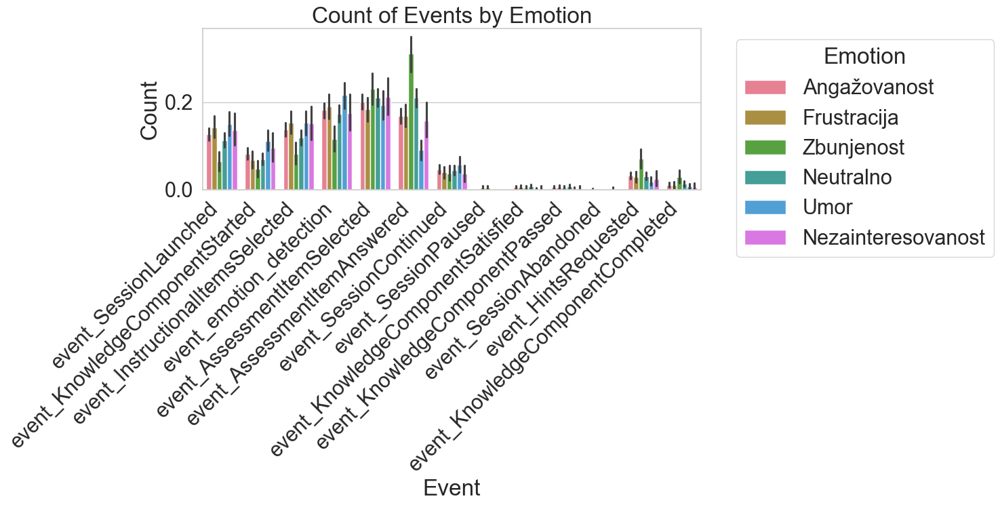

In [222]:
plot_data = pd.DataFrame({'Emotion': merged_df['Emotion']})
for event in events:
    plot_data[event] = merged_df[event]

# Melt the DataFrame for easy plotting
plot_data = pd.melt(plot_data, id_vars=['Emotion'], var_name='Event', value_name='Count')

# Create the grouped bar plot
plt.figure(figsize=(15, 8))
sb.barplot(x='Event', y='Count', hue='Emotion', data=plot_data)
plt.title('Count of Events by Emotion')
plt.xlabel('Event')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
plt.legend(title='Emotion', bbox_to_anchor=(1.05, 1), loc='upper left')  # Move the legend to the upper left

plt.tight_layout()
plt.savefig('grouped_bar_plot.png')
plt.show()

In [133]:
temp_dict = {
    'emotion_detection' : 1,
    'InstructionalItemsSelected' : 2,
    'SessionLaunched' : 3,
    'KnowledgeComponentStarted' : 4,
    'AssessmentItemSelected' : 5,
    'SessionContinued' : 6,
    'SessionPaused' : 7,
    'KnowledgeComponentSatisfied' : 8,
    'KnowledgeComponentPassed' : 9,
    'SessionAbandoned' : 10,
    'HintsRequested' : 11,
    'KnowledgeComponentCompleted' : 12,
}

merged_df['Event'] = merged_df['Event'].map(temp_dict)

temp_dict = {
    'Angažovanost' : 1,
    'Neutralno' : 1,
    'Frustracija' : 2,
    'Zbunjenost' : 3,
    'Nezainteresovanost' : 4,
    'Umor' : 5,
    
}

merged_df['Emotion'] = merged_df['Emotion'].map(temp_dict)

In [134]:
correlation_matrix = merged_df.corr()

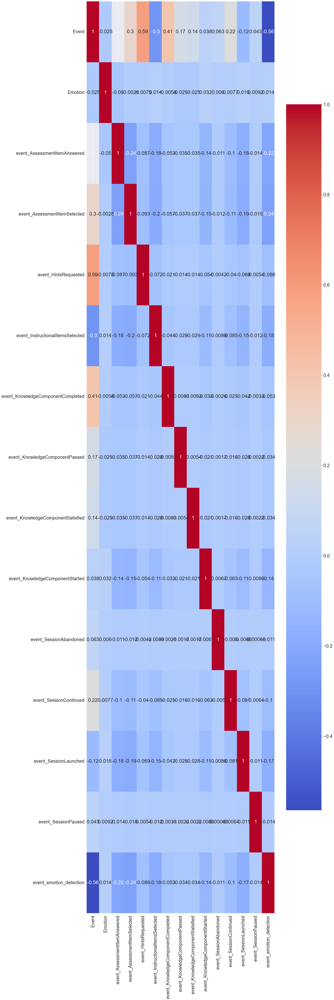

In [135]:
plt.figure(figsize=(20, 6 * 13))
sb.heatmap(correlation_matrix, annot=True, cmap='coolwarm', )
plt.savefig('correlation_matrix.png')
plt.show()

In [136]:
sequences_df_copy.head()

,Unnamed: 0,DateTime,event_description,hint_order,correct_answer,correctness_percentage,reattempt_count,submission_type,knowledge_component_code,LearnerId,Emotion,TimeOfDay
0,223366,2023-05-03 08:21:34.053373100+00:00,SessionLaunched,-1,-1,-1.0,-1,NaN,-299,-9991,1,1
1,223367,2023-05-03 08:21:34.053384+00:00,KnowledgeComponentStarted,-1,-1,-1.0,-1,NaN,-299,-9991,1,1
2,223368,2023-05-03 08:21:34.227705200+00:00,InstructionalItemsSelected,-1,-1,-1.0,-1,NaN,-299,-9991,1,1
3,223369,2023-05-03 08:21:41.060951500+00:00,SessionTerminated,-1,-1,-1.0,-1,NaN,-299,-9991,1,1
4,223371,2023-05-03 08:23:55.677682100+00:00,SessionLaunched,-1,-1,-1.0,-1,NaN,291,-9991,1,1


In [138]:
numeric_df = sequences_df_copy.select_dtypes(include='number')
correlation_matrix = numeric_df.corr()

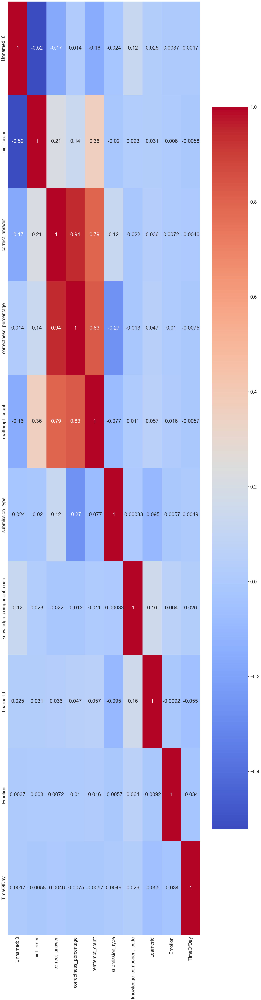

In [139]:
plt.figure(figsize=(20, 6 * 13))
sb.heatmap(correlation_matrix, annot=True, cmap='coolwarm', )
plt.savefig('correlation_matrix_1.png')
plt.show()